# Problem 1, Parts C-E: Stochastic Gradient Descent Visualization

In this Jupyter notebook, we visualize how SGD works. 
This visualization corresponds to parts C-E of question 1 in homework 2.

Use this notebook to write your code for problem 1 parts C-E by filling in the sections marked `# TODO` and running all cells.

In [59]:
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image

from sgd_helper import (
    generate_dataset1,
    generate_dataset2,
    plot_dataset,
    plot_loss_function,
    animate_convergence,
    animate_sgd_suite,
)

## Problem 1C: Implementation of SGD

Fill in the loss, gradient, and SGD functions according to the guidelines given in the problem statement in order to perform SGD.

In [60]:
def loss(X, Y, w):
    """
    Calculate the squared loss function.

    Inputs:
        X: A (N, D) shaped numpy array containing the data points.
        Y: A (N, ) shaped numpy array containing the (float) labels of the data points.
        w: A (D, ) shaped numpy array containing the weight vector.

    Outputs:
        The loss evaluated with respect to X, Y, and w.
    """

    residuals = np.matmul(X, w) - Y
    squared_loss = np.sum(residuals ** 2)
    mean_squared_loss = squared_loss / len(X)
    return mean_squared_loss


def gradient(x, y, w):
    """
    Calculate the gradient of the loss function with respect to
    a single point (x, y), and using weight vector w.

    Inputs:
        x: A (D, ) shaped numpy array containing a single data point.
        y: The float label for the data point.
        w: A (D, ) shaped numpy array containing the weight vector.

    Output:
        The gradient of the loss with respect to x, y, and w.
    """

    gradient = 2 * (np.matmul(x, w) - y) * x
    return gradient


def SGD(X, Y, w_start, eta, N_epochs):
    """
    Perform SGD using dataset (X, Y), initial weight vector w_start,
    learning rate eta, and N_epochs epochs.

    Inputs:
        X: A (N, D) shaped numpy array containing the data points.
        Y: A (N, ) shaped numpy array containing the (float) labels of the data points.
        w_start:  A (D, ) shaped numpy array containing the weight vector initialization.
        eta: The step size.
        N_epochs: The number of epochs (iterations) to run SGD.

    Outputs:
        W: A (N_epochs, D) shaped array containing the weight vectors from all iterations.
        losses: A (N_epochs, ) shaped array containing the losses from all iterations.
    """

    W = np.zeros((N_epochs, len(w_start)))
    losses = np.zeros(N_epochs)

    w = w_start.copy()
    for epoch in range(N_epochs):
        indices = np.random.permutation(len(X))
        for i in indices:
            w -= eta * gradient(X[i], Y[i], w)

        W[epoch] = w
        losses[epoch] = loss(X, Y, w)

    return W, losses


## Problem 1D: Visualization

### Dataset

We'll start off by generating two simple 2-dimensional datasets. 
For simplicity, we do not consider separate training and test sets.

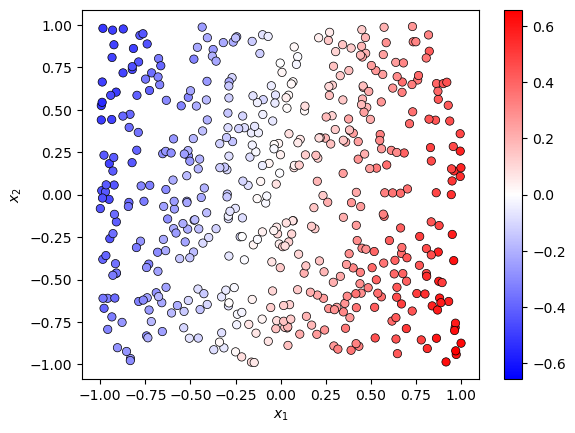

(<Figure size 640x480 with 2 Axes>, <Axes: xlabel='$x_1$', ylabel='$x_2$'>)

In [61]:
X1, Y1 = generate_dataset1()
plot_dataset(X1, Y1)

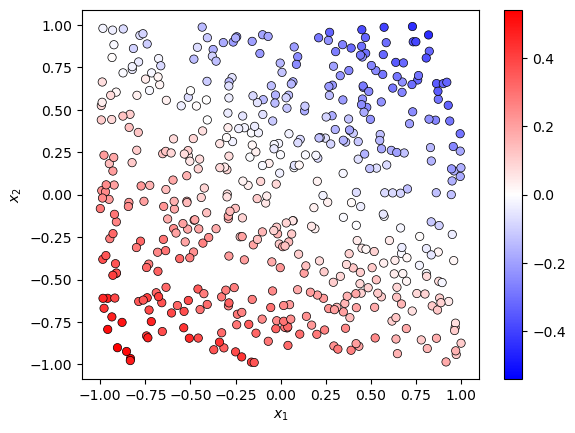

(<Figure size 640x480 with 2 Axes>, <Axes: xlabel='$x_1$', ylabel='$x_2$'>)

In [62]:
X2, Y2 = generate_dataset2()
plot_dataset(X2, Y2)

### SGD from a single point

First, let's visualize SGD from a single starting point:

MovieWriter imagemagick unavailable; using Pillow instead.


Performing SGD with parameters {'w_start': [0.01, 0.01], 'eta': 1e-05} ...

Animating...


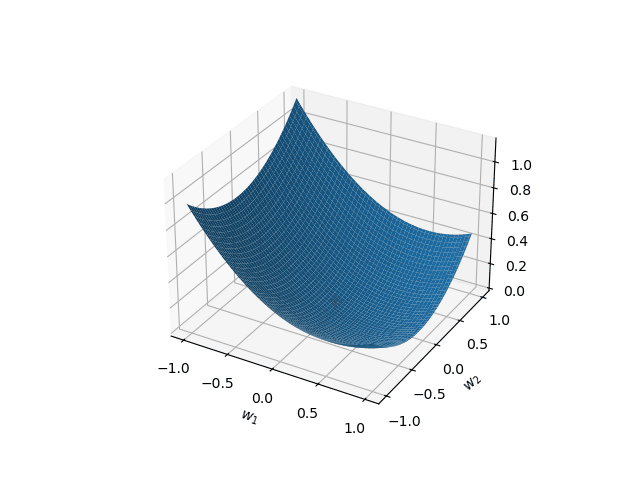

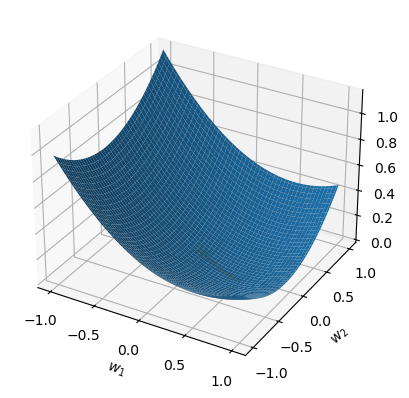

In [63]:
# Parameters to feed the SGD.
# <FR> changes the animation speed.
params = ({"w_start": [0.01, 0.01], "eta": 0.00001},)
N_epochs = 1000
FR = 20

# Let's animate it!
anim = animate_sgd_suite(SGD, loss, X1, Y1, params, N_epochs, FR)
anim.save("animation1.gif", fps=30, writer="imagemagick")
Image(open("animation1.gif", "rb").read())

Let's view how the weights change as the algorithm converges:


Animating...


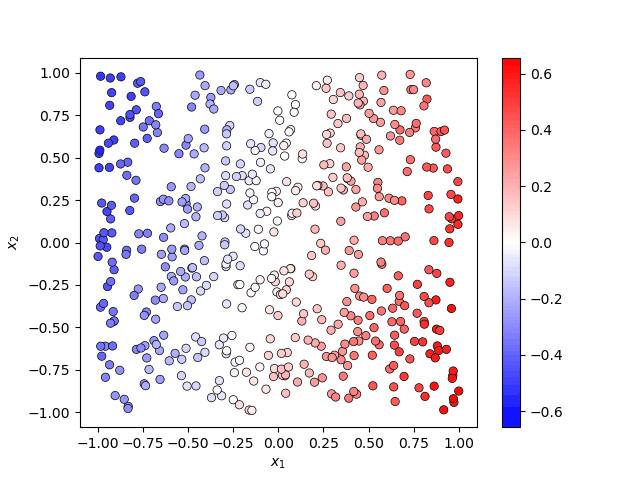

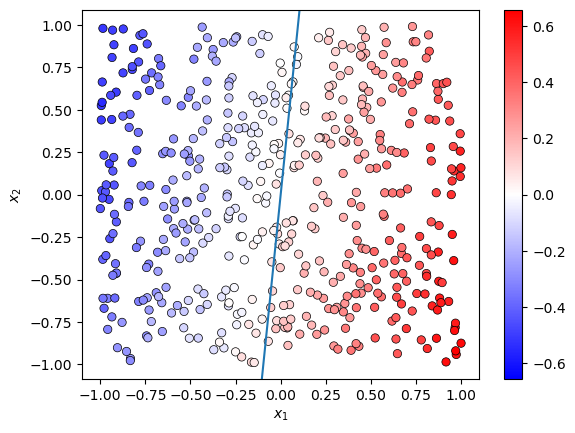

In [64]:
# Parameters to feed the SGD.
params = ({"w_start": [0.01, 0.01], "eta": 0.00001},)
N_epochs = 1000
FR = 20

# Let's do it!
W, _ = SGD(X1, Y1, params[0]["w_start"], params[0]["eta"], N_epochs)
anim = animate_convergence(X1, Y1, W, FR)
anim.save("animation2.gif", fps=30, writer="pillow")
Image(open("animation2.gif", "rb").read())

### SGD from multiple points

Now, let's visualize SGD from multiple arbitrary starting points:

Performing SGD with parameters {'w_start': [-0.8, -0.3], 'eta': 1e-05} ...
Performing SGD with parameters {'w_start': [-0.9, 0.4], 'eta': 1e-05} ...
Performing SGD with parameters {'w_start': [-0.4, 0.9], 'eta': 1e-05} ...
Performing SGD with parameters {'w_start': [0.8, 0.8], 'eta': 1e-05} ...

Animating...


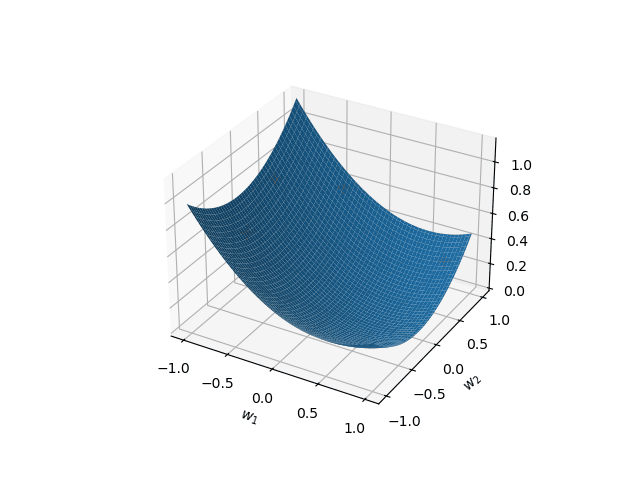

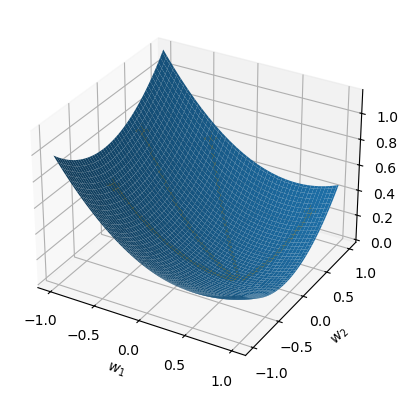

In [65]:
# Parameters to feed the SGD.
# Here, we specify each different set of initializations as a dictionary.
params = (
    {"w_start": [-0.8, -0.3], "eta": 0.00001},
    {"w_start": [-0.9, 0.4], "eta": 0.00001},
    {"w_start": [-0.4, 0.9], "eta": 0.00001},
    {"w_start": [0.8, 0.8], "eta": 0.00001},
)
N_epochs = 1000
FR = 20

# Let's go!
anim = animate_sgd_suite(SGD, loss, X1, Y1, params, N_epochs, FR)
anim.save("animation3.gif", fps=30, writer="pillow")
Image(open("animation3.gif", "rb").read())

Let's do the same thing but with a different dataset:

Performing SGD with parameters {'w_start': [-0.8, -0.3], 'eta': 1e-05} ...
Performing SGD with parameters {'w_start': [-0.9, 0.4], 'eta': 1e-05} ...
Performing SGD with parameters {'w_start': [-0.4, 0.9], 'eta': 1e-05} ...
Performing SGD with parameters {'w_start': [0.8, 0.8], 'eta': 1e-05} ...

Animating...


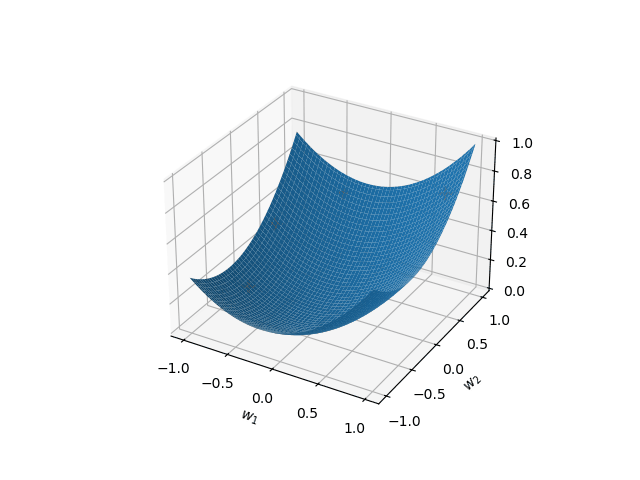

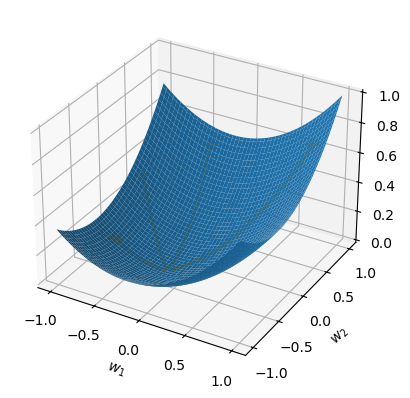

In [66]:
# Parameters to feed the SGD.
params = (
    {"w_start": [-0.8, -0.3], "eta": 0.00001},
    {"w_start": [-0.9, 0.4], "eta": 0.00001},
    {"w_start": [-0.4, 0.9], "eta": 0.00001},
    {"w_start": [0.8, 0.8], "eta": 0.00001},
)
N_epochs = 1000
FR = 20

# Animate!
anim = animate_sgd_suite(SGD, loss, X2, Y2, params, N_epochs, FR)
anim.save("animation4.gif", fps=30, writer="pillow")
Image(open("animation4.gif", "rb").read())

## Problem 1E: SGD with different step sizes

Now, let's visualize SGD with different step sizes (eta):

(For ease of visualization: the trajectories are ordered from left to right by increasing eta value. Also, note that we use smaller values of `N_epochs` and `FR` here for easier visualization.)

Performing SGD with parameters {'w_start': [0.7, 0.8], 'eta': 1e-05} ...
Performing SGD with parameters {'w_start': [0.2, 0.8], 'eta': 5e-05} ...
Performing SGD with parameters {'w_start': [-0.2, 0.7], 'eta': 0.0001} ...
Performing SGD with parameters {'w_start': [-0.6, 0.6], 'eta': 0.0002} ...

Animating...


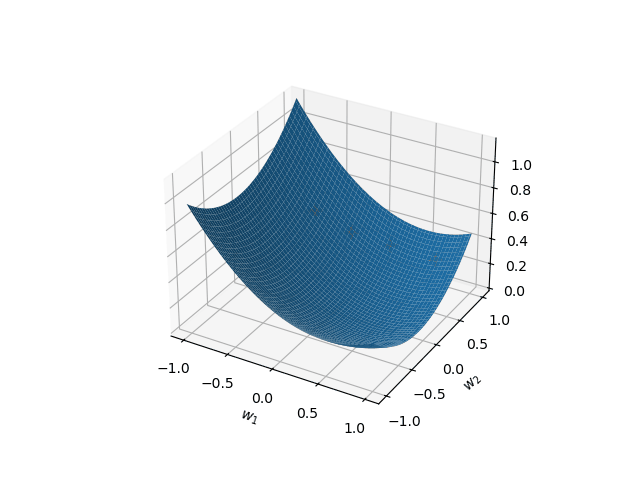

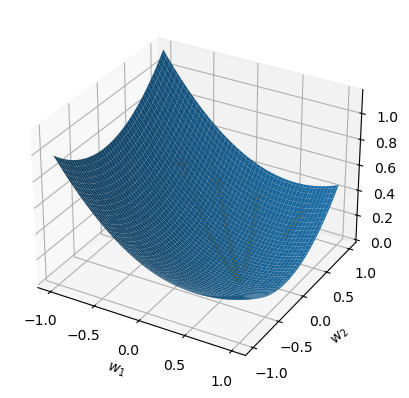

In [67]:
# Parameters to feed the SGD.
params = (
    {"w_start": [0.7, 0.8], "eta": 0.00001},
    {"w_start": [0.2, 0.8], "eta": 0.00005},
    {"w_start": [-0.2, 0.7], "eta": 0.0001},
    {"w_start": [-0.6, 0.6], "eta": 0.0002},
)
N_epochs = 100
FR = 2

# Go!
anim = animate_sgd_suite(SGD, loss, X1, Y1, params, N_epochs, FR, ms=2)
anim.save("animation5.gif", fps=30, writer="pillow")
Image(open("animation5.gif", "rb").read())

### Plotting SGD Convergence

Let's visualize the difference in convergence rates a different way. Plot the loss with respect to epoch (iteration) number for each value of eta on the same graph.

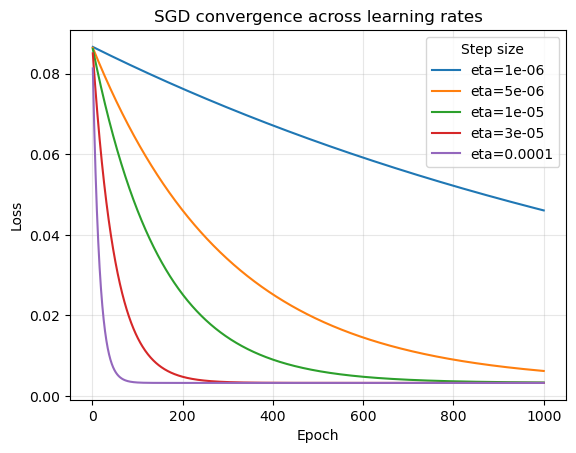

In [68]:
"""Plotting SGD convergence"""

eta_vals = [1e-6, 5e-6, 1e-5, 3e-5, 1e-4]
w_start = [0.01, 0.01]
N_epochs = 1000

fig, ax = plt.subplots()
for eta in eta_vals:
    _, losses = SGD(X1, Y1, np.array(w_start, dtype=float), eta, N_epochs)
    ax.plot(np.arange(1, N_epochs + 1), losses, label=f"eta={eta:g}")
ax.set_xlabel("Epoch")
ax.set_ylabel("Loss")
ax.set_title("SGD convergence across learning rates")
ax.legend(title="Step size")
ax.grid(True, alpha=0.3)

# Save for inclusion in LaTeX
plt.savefig("../images/sgd_convergence_eta.png", dpi=150, bbox_inches="tight")
plt.show()


Clearly, a big step size results in fast convergence! Why don't we just set eta to a really big value, then? Say, eta=1?

(Again, note that the FR is lower for this animation.)

Performing SGD with parameters {'w_start': [0.01, 0.01], 'eta': 1} ...

Animating...


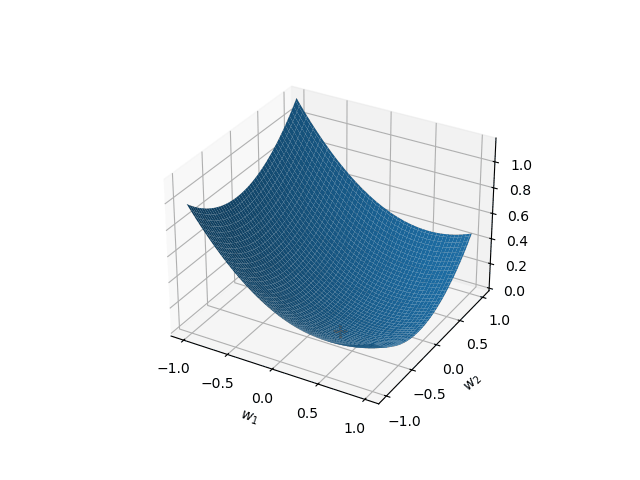

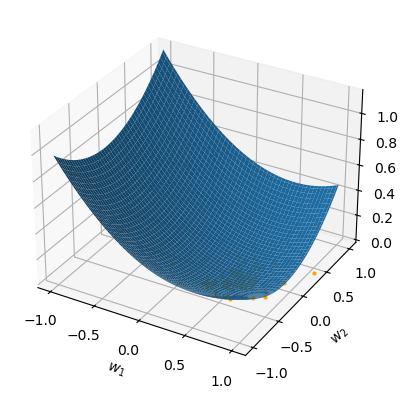

In [69]:
# Parameters to feed the SGD.
params = ({"w_start": [0.01, 0.01], "eta": 1},)
N_epochs = 100
FR = 2

# Voila!
anim = animate_sgd_suite(SGD, loss, X1, Y1, params, N_epochs, FR, ms=2)
anim.save("animation6.gif", fps=30, writer="pillow")
Image(open("animation6.gif", "rb").read())

Just for fun, let's try eta=10 as well. What happens? (Hint: look at W)

In [70]:
# Parameters to feed the SGD.
w_start = [0.01, 0.01]
eta = 10
N_epochs = 100

# Presto!
W, losses = SGD(X1, Y1, w_start, eta, N_epochs)

/var/folders/7j/kw_xn86n2r3dctrmw77g3ych0000gn/T/ipykernel_8510/2804396315.py:62: RuntimeWarning: overflow encountered in multiply
  w -= eta * gradient(X[i], Y[i], w)
/var/folders/7j/kw_xn86n2r3dctrmw77g3ych0000gn/T/ipykernel_8510/2804396315.py:34: RuntimeWarning: invalid value encountered in matmul
  gradient = 2 * (np.matmul(x, w) - y) * x


## Extra Visualization (not part of the homework problem)

One final visualization! What happens if the loss function has multiple optima?

Performing SGD with parameters {'w_start': [0.9, 0.9], 'eta': 0.01} ...
Performing SGD with parameters {'w_start': [0.0, 0.0], 'eta': 0.01} ...
Performing SGD with parameters {'w_start': [-0.8, 0.6], 'eta': 0.01} ...
Performing SGD with parameters {'w_start': [-0.8, -0.6], 'eta': 0.01} ...
Performing SGD with parameters {'w_start': [-0.4, -0.3], 'eta': 0.01} ...

Animating...


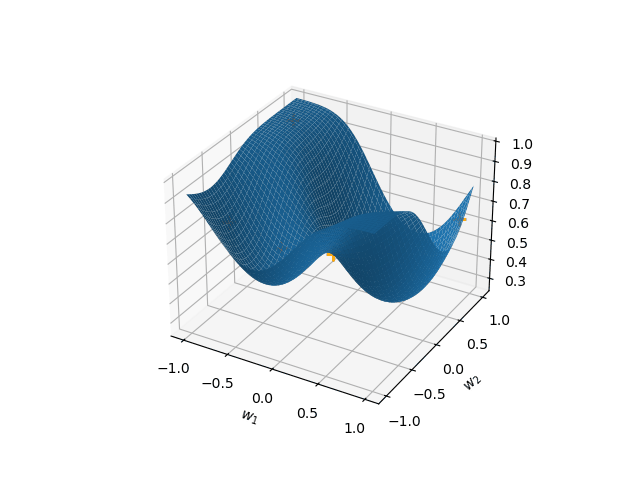

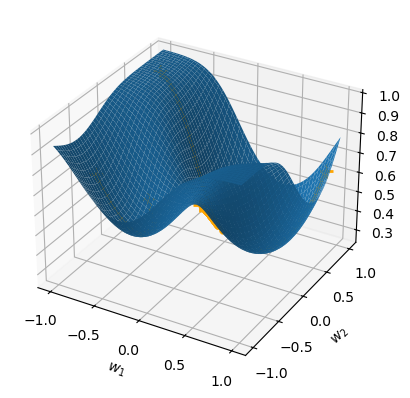

In [71]:
# Import different SGD & loss functions.
# In particular, the loss function has multiple optima.
from sgd_multiopt_helper import SGD, loss

# Parameters to feed the SGD.
params = (
    {"w_start": [0.9, 0.9], "eta": 0.01},
    {"w_start": [0.0, 0.0], "eta": 0.01},
    {"w_start": [-0.8, 0.6], "eta": 0.01},
    {"w_start": [-0.8, -0.6], "eta": 0.01},
    {"w_start": [-0.4, -0.3], "eta": 0.01},
)
N_epochs = 100
FR = 2

# One more time!
anim = animate_sgd_suite(SGD, loss, X1, Y1, params, N_epochs, FR, ms=2)
anim.save("animation7.gif", fps=30, writer="pillow")
Image(open("animation7.gif", "rb").read())